# Assumptions/Context:
* Main goal is two part = predict test/unknown cases; and identify driving factors
* Assume both train and test data is available for analysis, feature engineering, imputation, etc.
* Attacking the problem as if labels were lost and want to determine most accurate prediction

# Notes:
* '_calc' features were not used as inputs to the models
* Usually would do train-test split before missing value imputation and other if end goal is to be in a prod environment; however, treating the experiment as mentioned

# 1) Exploratory Data Analysis
Notes:
* Target highly correlated with 'Sex'
* Indication of multicolinearity
* Check 'Fare' of 'number_of_persons'-feature

Features to investigate:
* Missing value indicator feature for 'Cabin' and 'Age'
* Extract 'Mr', 'Mrs', etc. 
* 'Sex' to binary flag
* 'Ticket's have more than 1 person associated to them. Built number of persons per ticket as feature.

## 1.1) Import packages and data

In [1]:
# Import packages
import numpy as np 
import pandas as pd 
# from pandas_profiling import ProfileReport
from ydata_profiling import ProfileReport
import os
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, VotingClassifier
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score, KFold
import shap
import lightgbm as lgb
from sklearn.model_selection import cross_validate

/opt/conda/lib/python3.10/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/opt/conda/lib/python3.10/site-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


In [2]:
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session
# os.remove("/kaggle/working/file_name.csv")

/kaggle/input/titanic/train.csv
/kaggle/input/titanic/test.csv
/kaggle/input/titanic/gender_submission.csv


In [3]:
# Import data
train = pd.read_csv('/kaggle/input/titanic/train.csv')
test = pd.read_csv('/kaggle/input/titanic/test.csv')
ge_subm = pd.read_csv('/kaggle/input/titanic/gender_submission.csv')

In [4]:
# Create combined data (train and test)
# Add a 'Survived' column to the 'test' DataFrame
test['Survived'] = None 
# Reorder columns in the 'test' DataFrame to match the order in 'train'
test = test[train.columns]
# Append both DataFrames to create 'combined'
combined = pd.concat([train, test], ignore_index=True)

In [5]:
print('train passengers: ', len(train))
print('test passengers:  ', len(test))
print('combined passengers:  ', len(combined))

train passengers:  891
test passengers:   418
combined passengers:   1309


In [6]:
combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1309 entries, 0 to 1308
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  1309 non-null   int64  
 1   Survived     891 non-null    object 
 2   Pclass       1309 non-null   int64  
 3   Name         1309 non-null   object 
 4   Sex          1309 non-null   object 
 5   Age          1046 non-null   float64
 6   SibSp        1309 non-null   int64  
 7   Parch        1309 non-null   int64  
 8   Ticket       1309 non-null   object 
 9   Fare         1308 non-null   float64
 10  Cabin        295 non-null    object 
 11  Embarked     1307 non-null   object 
dtypes: float64(2), int64(4), object(6)
memory usage: 122.8+ KB


In [7]:
combined.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


## 1.2) Create binary flags for: 'Sex' & 'Embarked'
***Engineered features = 'male', 'S', 'C', 'Q'***

In [8]:
# Create dummy variables for the 'Sex' column
sex_dummies = pd.get_dummies(combined['Sex'], drop_first=True).astype(int)

In [9]:
# Create dummy variables for the 'Embarked' column
# Don't drop_first as there are missing values for 'Embarked' & imputation needs to take place later
embarked_dummies = pd.get_dummies(combined['Embarked'], drop_first=False).astype(int)
# Identify rows with missing values in the original column
missing_rows = combined['Embarked'].isnull()
# Set all dummy variables to None for rows with missing values
embarked_dummies.loc[missing_rows] = None

In [10]:
combined = pd.concat([combined, sex_dummies, embarked_dummies], axis=1)

In [11]:
combined['male'].value_counts(normalize=True)

male
1    0.644003
0    0.355997
Name: proportion, dtype: float64

In [12]:
combined['Embarked'].value_counts(normalize=True)

Embarked
S    0.699311
C    0.206580
Q    0.094109
Name: proportion, dtype: float64

## **1.3) Extract 'Mr', 'Mrs', 'Miss' & 'other'**
***Engineered features = 'mr', 'mrs', 'other'***

In [13]:
# Custom function to extract titles
def extract_title(name):
    name_lower = name.lower()
    if 'mrs' in name_lower:
        return 'mrs'
    elif 'mr' in name_lower:
        return 'mr'
    elif 'miss' in name_lower:
        return 'miss'
    else:
        return 'other'

# Apply the function to the 'A' column and create a new column 'Title'
combined['Title'] = combined['Name'].apply(extract_title)
# Create dummy variables for the 'Title' column
title_dummies = pd.get_dummies(combined['Title'], drop_first=True).astype(int)
# Concatenate the dummy variables with the original DataFrame
combined = pd.concat([combined, title_dummies], axis=1)

In [14]:
combined['Title'].value_counts(normalize=True)

Title
mr       0.579068
miss     0.197097
mrs      0.153552
other    0.070283
Name: proportion, dtype: float64

## **1.4) Report**

In [15]:
# Create a ProfileReport
profile = ProfileReport(combined, title='Pandas Profiling Report', explorative=True)
# Save the report as an HTML file (optional)
# profile.to_file("eda_report.html")
# Display the report in the notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 2) Missing Values
Notes:
* Cabin_missing indicator seems to be correlated with the target - engineer Cabin_missing and drop 'Cabin'
* Age_missing as a feature not showing potential

In [16]:
# add a missing value indicator for variables: 'Age', 'Cabin'
# Specify the columns you want to analyze and create missing value indicators for
columns_to_analyze = ['Age', 'Cabin']
# Create missing value indicator variables
for column in columns_to_analyze:
    missing_indicator_column = f'{column}_missing'
    combined[missing_indicator_column] = combined[column].isnull().astype(int)

In [17]:
# Run EDA on relavant variables together with newly created missing flags
# Note do not include base features of missing flags
exclude_list = ['PassengerId', 'Name', 'Ticket', 'Cabin', 'Sex', 'Embarked', 'Title']
# Create a ProfileReport
profile = ProfileReport(combined.drop(exclude_list, axis=1, errors='ignore'), title='Pandas Profiling Report', explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## **2.1) Imputation: 'Age', 'Fare' & 'Embarked' using IterativeImputer (estimator=RandomForestRegressor())**

In [18]:
# Drop Cabin
column_to_drop = 'Cabin'
# Drop the specified column
combined = combined.drop(column_to_drop, axis=1)

In [19]:
combined.isnull().sum()

PassengerId        0
Survived         418
Pclass             0
Name               0
Sex                0
Age              263
SibSp              0
Parch              0
Ticket             0
Fare               1
Embarked           2
male               0
C                  2
Q                  2
S                  2
Title              0
mr                 0
mrs                0
other              0
Age_missing        0
Cabin_missing      0
dtype: int64

In [20]:
# Separate the target variable 'Survived'
sep_vars = ['PassengerId','Survived','Name','Sex','Ticket','Embarked', 'Title']
target_df = combined[sep_vars]
impute_df = combined.drop(sep_vars, axis=1)

# Define imputer
imputer = IterativeImputer(random_state=100, estimator=RandomForestRegressor())

# Fit and transform the dataframe
imputed_data = imputer.fit_transform(impute_df)
buildset = pd.DataFrame(imputed_data, columns=impute_df.columns)

# Re-add the target variable 'Survived'
buildset[sep_vars] = target_df
buildset.head()

[IterativeImputer] Early stopping criterion not reached.


,Pclass,Age,SibSp,Parch,Fare,male,C,Q,S,mr,...,other,Age_missing,Cabin_missing,PassengerId,Survived,Name,Sex,Ticket,Embarked,Title
0,3.0,22.0,1.0,0.0,7.2500,1.0,0.0,0.0,1.0,1.0,...,0.0,0.0,1.0,1,0,"Braund, Mr. Owen Harris",male,A/5 21171,S,mr
1,1.0,38.0,1.0,0.0,71.2833,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,PC 17599,C,mrs
2,3.0,26.0,0.0,0.0,7.9250,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,3,1,"Heikkinen, Miss. Laina",female,STON/O2. 3101282,S,miss
3,1.0,35.0,1.0,0.0,53.1000,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,113803,S,mrs
4,3.0,35.0,0.0,0.0,8.0500,1.0,0.0,0.0,1.0,1.0,...,0.0,0.0,1.0,5,0,"Allen, Mr. William Henry",male,373450,S,mr


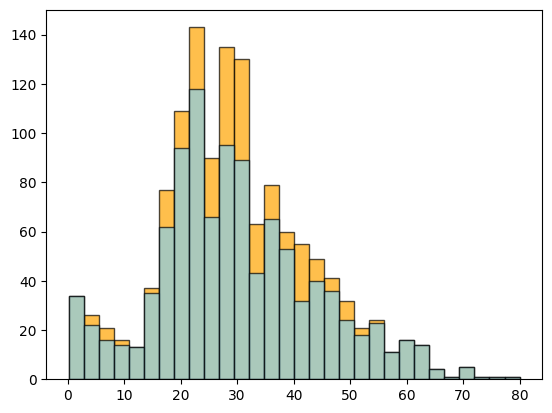

In [21]:
plt.hist(buildset['Age'], bins=30, color='orange', edgecolor='black', alpha=0.7, label='After Imputation')
plt.hist(combined['Age'], bins=30, color='skyblue', edgecolor='black', alpha=0.7, label='Before Imputation')
plt.show()

In [22]:
buildset.isnull().sum()

Pclass             0
Age                0
SibSp              0
Parch              0
Fare               0
male               0
C                  0
Q                  0
S                  0
mr                 0
mrs                0
other              0
Age_missing        0
Cabin_missing      0
PassengerId        0
Survived         418
Name               0
Sex                0
Ticket             0
Embarked           2
Title              0
dtype: int64

In [23]:
# Function to override values based on the maximum - in case of binary imputed features
def override_predictions(row, columns):
    max_col = max(columns, key=lambda col: row[col])
    for col in columns:
        row[col] = 1 if col == max_col else 0
    return row

In [24]:
# List of columns to override
columns_to_override = ['C', 'Q', 'S']
# Apply the function to each row in the DataFrame
buildset = buildset.apply(lambda row: override_predictions(row, columns_to_override), axis=1)

In [25]:
buildset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1309 entries, 0 to 1308
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Pclass         1309 non-null   float64
 1   Age            1309 non-null   float64
 2   SibSp          1309 non-null   float64
 3   Parch          1309 non-null   float64
 4   Fare           1309 non-null   float64
 5   male           1309 non-null   float64
 6   C              1309 non-null   int64  
 7   Q              1309 non-null   int64  
 8   S              1309 non-null   int64  
 9   mr             1309 non-null   float64
 10  mrs            1309 non-null   float64
 11  other          1309 non-null   float64
 12  Age_missing    1309 non-null   float64
 13  Cabin_missing  1309 non-null   float64
 14  PassengerId    1309 non-null   int64  
 15  Survived       891 non-null    float64
 16  Name           1309 non-null   object 
 17  Sex            1309 non-null   object 
 18  Ticket  

# 3) Feature Engineering
Notes:
1. Number of persons per ticket feature


## **3.1) Number of persons per ticket feature**

In [26]:
# Below shows relatively high overlap of train tickets with test tickets
print('train: ',train['Ticket'].drop_duplicates().count())
print('test: ', test['Ticket'].drop_duplicates().count())
print('buildset: ', buildset['Ticket'].drop_duplicates().count())
print('overlap: ', train['Ticket'].drop_duplicates().count()+test['Ticket'].drop_duplicates().count()-combined['Ticket'].drop_duplicates().count())

train:  681
test:  363
buildset:  929
overlap:  115


**Build out 3 features:**
* total other persons with same ticket
* total other persons (with outcome) with same ticket *(maybe engineer)*
* total other survivors with same ticket

(key word 'other')

**Note:**
* These features open up interesting questions regarding target leakage, train-test splits, etc. However, given the initial disclaimers and context provided, the problem was attacked assuming a scenario that the labels for certain cases was lost. Also, given the usecase description/context provided: "predict if a passenger survived the sinking of the Titanic or not" - the tast is aimed at predicting if someone 'has' survived, not 'is going to' survive. Therefore, extending the availability of certain features/elements that can be considered, like: has anyone else with the same ticket survived?
* If the above doesn't hold, it would show in the test data performance and should be removed and re-tested

***Engineered features = 'no_passengers_ticket', 'other_survivors', 'other_casualties' & 'price_per_passenger'***

In [27]:
# Number of persons per ticket distribution
# Ie. 132 passengers have a ticket for 2 people
buildset.groupby('Ticket')['PassengerId'].count().reset_index(name='ID_count')['ID_count'].value_counts()

ID_count
1     713
2     132
3      49
4      16
5       7
7       5
6       4
8       2
11      1
Name: count, dtype: int64

In [28]:
# 'number_of_passengers_ticket'-feature
passengers_ticket = pd.DataFrame(buildset.groupby('Ticket')['PassengerId'].count().reset_index())
passengers_ticket.columns = ['Ticket', 'no_passengers_ticket']
passengers_ticket

,Ticket,no_passengers_ticket
0,110152,3
1,110413,3
2,110465,2
3,110469,1
4,110489,1
...,...,...
924,W./C. 6608,5
925,W./C. 6609,1
926,W.E.P. 5734,2
927,W/C 14208,1


In [29]:
# Create 'Survived_calc' to build 'other_survivors'-feature and 'other_casualties'-feature
buildset['Survived_calc'] = buildset['Survived'].fillna(0)
buildset['Died_calc'] = 1 - buildset['Survived']
buildset['Died_calc'] = buildset['Died_calc'].fillna(0)

In [30]:
# number of survivors per ticket to be used in later manipulation
# NB! Drop 'no_survived_passengers_ticket_calc'
survived_passengers_ticket = pd.DataFrame(buildset.groupby('Ticket')['Survived'].sum().reset_index())
survived_passengers_ticket.columns = ['Ticket', 'no_survived_passengers_ticket_calc']
survived_passengers_ticket

,Ticket,no_survived_passengers_ticket_calc
0,110152,3.0
1,110413,2.0
2,110465,0.0
3,110469,0.0
4,110489,0.0
...,...,...
924,W./C. 6608,0.0
925,W./C. 6609,0.0
926,W.E.P. 5734,0.0
927,W/C 14208,0.0


In [31]:
# number of casualties per ticket to be used in later manipulation
# NB! Drop 'no_casualties_passengers_ticket_calc'
casualties_ticket = pd.DataFrame(buildset.groupby('Ticket')['Died_calc'].sum().reset_index())
casualties_ticket.columns = ['Ticket', 'no_casualties_ticket_calc']
casualties_ticket

,Ticket,no_casualties_ticket_calc
0,110152,0.0
1,110413,1.0
2,110465,2.0
3,110469,0.0
4,110489,0.0
...,...,...
924,W./C. 6608,4.0
925,W./C. 6609,1.0
926,W.E.P. 5734,1.0
927,W/C 14208,1.0


In [32]:
# Join passengers_ticket, survived_passengers_ticket, casualties_ticket
joined_passengers = pd.merge(pd.merge(passengers_ticket, survived_passengers_ticket, on='Ticket', how='inner'), casualties_ticket, on='Ticket', how='inner')

In [33]:
# add elements to table to create final 'other_survivors'-feature
buildset = pd.merge(buildset, joined_passengers, on='Ticket', how='inner')

In [34]:
# Create final 'other_survivors'-feature and 'other_casualties'-feature
buildset['other_survivors'] = buildset['no_survived_passengers_ticket_calc']-buildset['Survived_calc']
buildset['other_casualties'] = buildset['no_casualties_ticket_calc']-buildset['Died_calc']

In [35]:
buildset[['Ticket', 'PassengerId', 'Survived', 'no_passengers_ticket', 'no_survived_passengers_ticket_calc', 'no_casualties_ticket_calc', 'Survived_calc', 'Died_calc', 'other_survivors', 'other_casualties']].head()

,Ticket,PassengerId,Survived,no_passengers_ticket,no_survived_passengers_ticket_calc,no_casualties_ticket_calc,Survived_calc,Died_calc,other_survivors,other_casualties
0,A/5 21171,1,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0
1,PC 17599,2,1.0,2,1.0,0.0,1.0,0.0,0.0,0.0
2,PC 17599,1126,NaN,2,1.0,0.0,0.0,0.0,1.0,0.0
3,STON/O2. 3101282,3,1.0,1,1.0,0.0,1.0,0.0,0.0,0.0
4,113803,4,1.0,2,1.0,1.0,1.0,0.0,0.0,1.0


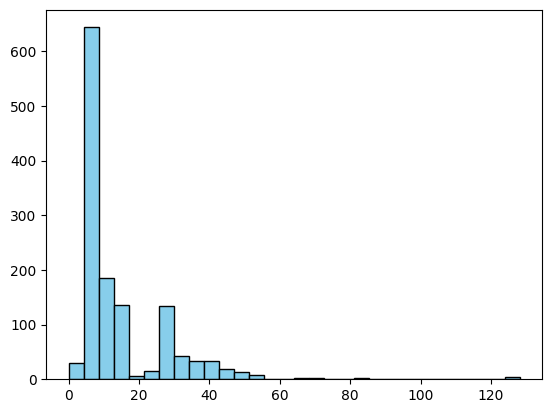

In [36]:
# Plotting the distribution
buildset['price_per_passenger'] = buildset['Fare'] / buildset['no_passengers_ticket']
plt.hist(buildset['price_per_passenger'], bins=30, color='skyblue', edgecolor='black')
plt.show()

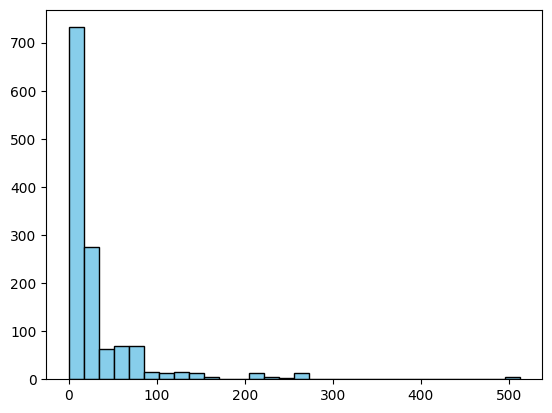

In [37]:
plt.hist(buildset['Fare'], bins=30, color='skyblue', edgecolor='black')
plt.show()

In [38]:
buildset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1309 entries, 0 to 1308
Data columns (total 29 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Pclass                              1309 non-null   float64
 1   Age                                 1309 non-null   float64
 2   SibSp                               1309 non-null   float64
 3   Parch                               1309 non-null   float64
 4   Fare                                1309 non-null   float64
 5   male                                1309 non-null   float64
 6   C                                   1309 non-null   int64  
 7   Q                                   1309 non-null   int64  
 8   S                                   1309 non-null   int64  
 9   mr                                  1309 non-null   float64
 10  mrs                                 1309 non-null   float64
 11  other                               1309 no

**Features to consider:** Pclass, Age, SibSp, Parch, Fare, Age_missing, Cabin_missing, mr, mrs, other, male, Q, S, no_passengers_ticket, other_survivors, other_casualties, price_per_passenger

In [39]:
# Run EDA on relavant variables together with newly created missing flags
# Note do not include base features of missing flags
exclude_list = ['PassengerId', 'Name', 'Ticket', 'Cabin', 'Sex', 'Embarked', 'Title', 'Survived_calc', 'Died_calc', 'no_survived_passengers_ticket_calc', 'no_casualties_ticket_calc']
# Create a ProfileReport
profile = ProfileReport(buildset.drop(exclude_list, axis=1, errors='ignore'), title='Pandas Profiling Report', explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 4) Anomoly detection
Note:
Doesn't seem to be high rate of anomolies. Considering we are also going to apply tree based methods (that are robust agains outliers) no further manipulations required.

In [40]:
buildset.columns

Index(['Pclass', 'Age', 'SibSp', 'Parch', 'Fare', 'male', 'C', 'Q', 'S', 'mr',
       'mrs', 'other', 'Age_missing', 'Cabin_missing', 'PassengerId',
       'Survived', 'Name', 'Sex', 'Ticket', 'Embarked', 'Title',
       'Survived_calc', 'Died_calc', 'no_passengers_ticket',
       'no_survived_passengers_ticket_calc', 'no_casualties_ticket_calc',
       'other_survivors', 'other_casualties', 'price_per_passenger'],
      dtype='object')

In [41]:
def count_outliers(series):
    Q1 = series.quantile(0.25)
    Q2 = series.quantile(0.50)
    Q3 = series.quantile(0.75)
    lower_bound = Q1 - 3 * (Q2 - Q1)
    upper_bound = Q3 + 3 * (Q3 - Q2)
    outliers = (series < lower_bound) | (series > upper_bound)
    return outliers.sum()

# Calculate the number of outliers for each feature
continues_list = ['Pclass', 'Age', 'SibSp', 'Fare', 'no_passengers_ticket', 'price_per_passenger']
outliers_count = buildset[continues_list].apply(count_outliers)

# Sort features by the number of outliers in descending order
outliers_count = outliers_count.sort_values(ascending=False)

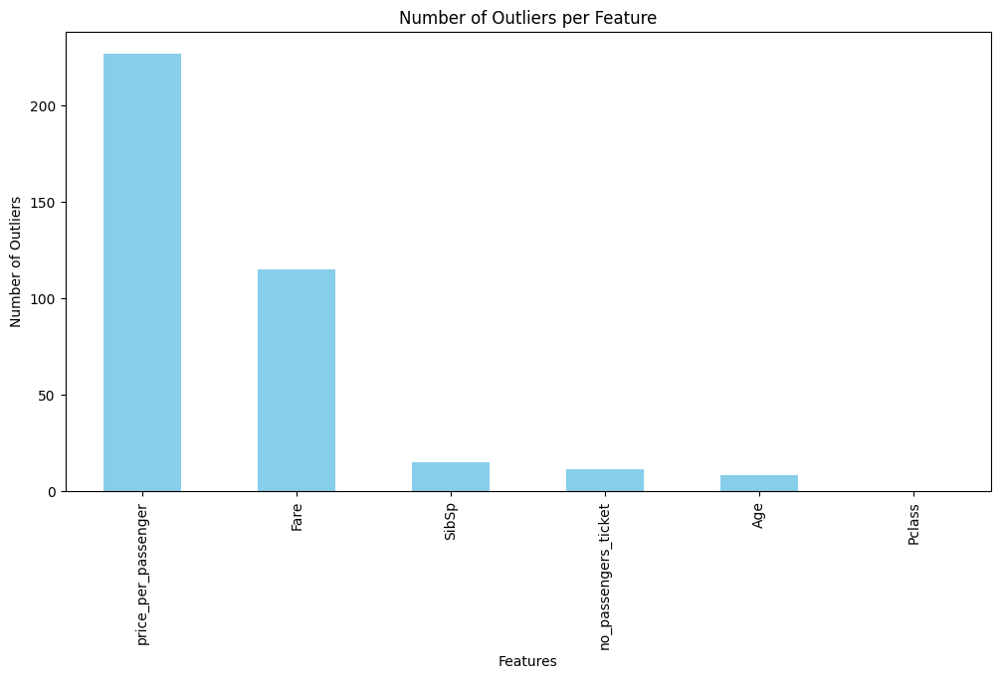

In [42]:
# Plot histogram
plt.figure(figsize=(12, 6))
outliers_count.plot(kind='bar', color='skyblue')
plt.title('Number of Outliers per Feature')
plt.xlabel('Features')
plt.ylabel('Number of Outliers')
plt.show()

# 5) Variable reduction

In [43]:
buildset.columns

Index(['Pclass', 'Age', 'SibSp', 'Parch', 'Fare', 'male', 'C', 'Q', 'S', 'mr',
       'mrs', 'other', 'Age_missing', 'Cabin_missing', 'PassengerId',
       'Survived', 'Name', 'Sex', 'Ticket', 'Embarked', 'Title',
       'Survived_calc', 'Died_calc', 'no_passengers_ticket',
       'no_survived_passengers_ticket_calc', 'no_casualties_ticket_calc',
       'other_survivors', 'other_casualties', 'price_per_passenger'],
      dtype='object')

In [44]:
def compute_vif(df, considered_features):
    X = df[considered_features].copy()
    # the calculation of variance inflation requires a constant
    X['intercept'] = 1
    # create dataframe to store vif values
    vif = pd.DataFrame()
    vif["Variable"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif = vif[vif['Variable']!='intercept']
    return vif

In [45]:
# Function to calculate correlation with target for each feature
def calculate_target_correlation(dataframe, target_column):
    correlation_data = dataframe.corrwith(dataframe[target_column])
    correlation_data = correlation_data.reset_index()
    correlation_data.columns = ['Variable', f'Correlation_with_{target_column}']
    return correlation_data

In [46]:
target_features = ['Pclass', 'Age', 'SibSp', 'Parch', 'Fare', 'male', 'C', 'S', 'Q', 'mr',
       'mrs', 'other', 'Age_missing', 'Cabin_missing', 'no_passengers_ticket',
       'other_survivors', 'other_casualties', 'price_per_passenger', 'Survived']
# Calculate correlation with target
correlation_result = calculate_target_correlation(buildset[target_features], 'Survived')

In [47]:
# remove 1 level of dummy based features (level with least representation)
considered_features = ['Pclass', 'Age', 'SibSp', 'Parch', 'male', 'C', 'S',
       'mrs', 'other', 'Age_missing', 'Cabin_missing',
       'other_survivors', 'other_casualties', 'price_per_passenger']
vif_result = compute_vif(buildset, considered_features).sort_values('VIF', ascending=False)
pd.merge(vif_result, correlation_result, left_on='Variable', right_on='Variable')
# removed: 'Q', 'mr', 'no_passengers_ticket', 'Fare'

,Variable,VIF,Correlation_with_Survived
0,Pclass,3.460736,-0.338481
1,C,3.175484,0.168240
2,S,3.166999,-0.149683
3,price_per_passenger,2.812873,0.288337
4,other_casualties,2.343938,-0.143693
5,Cabin_missing,2.199311,-0.316912
6,SibSp,1.923071,-0.035322
7,male,1.879924,-0.543351
8,mrs,1.795619,0.344223
9,Parch,1.707655,0.081629


# 6) Train-Validation-Test split

In [48]:
considered_features = ['Pclass', 'Age', 'male', 'C',
       'mrs', 'Cabin_missing',
       'other_survivors', 'other_casualties', 'price_per_passenger']

In [49]:
X_test = buildset[buildset['Survived'].isna()].set_index('PassengerId')[considered_features]
y_test = buildset[buildset['Survived'].isna()]['Survived']

In [50]:
X_test.head()

,Pclass,Age,male,C,mrs,Cabin_missing,other_survivors,other_casualties,price_per_passenger
PassengerId,,,,,,,,,
1126,1.0,39.000000,1.0,1,0.0,0.0,1.0,0.0,35.641650
1038,1.0,48.298333,1.0,0,0.0,0.0,0.0,1.0,25.931250
1281,3.0,6.000000,1.0,0,0.0,1.0,0.0,4.0,4.215000
1009,3.0,1.000000,0.0,0,0.0,0.0,2.0,0.0,5.566667
947,3.0,10.000000,1.0,0,0.0,1.0,0.0,5.0,4.854167


In [51]:
# train and validation data
X_tr_val = buildset[buildset['Survived'].notna()][considered_features]
y_tr_val = buildset[buildset['Survived'].notna()]['Survived']

In [52]:
X_train, X_val, y_train, y_val = train_test_split(buildset[buildset['Survived'].notna()][considered_features], buildset[buildset['Survived'].notna()]['Survived'], test_size=0.15, random_state=42)

In [53]:
print('train:      ', y_train.count())
print('validation: ', y_val.count())
print('test:       ', y_test.shape[0])

train:       757
validation:  134
test:        418


# 7) Variable Selection
Note:
All variables have importance to a certain degree. Keep all unless severe indication of overfitting, then consider reducing number of features.

In [54]:
# Fit a Random Forest classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Get variable importances
importances = rf_model.feature_importances_

# Sort variables by importance
sorted_idx = np.argsort(importances)[::-1]

# Calculate cumulative importance
cumulative_importance = np.cumsum(importances[sorted_idx])

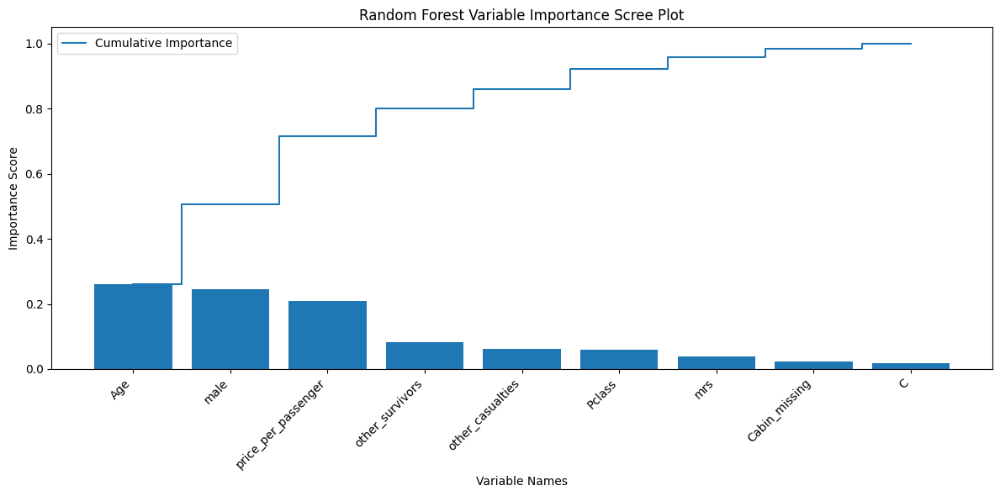

In [55]:
# Plot scree plot with variable names
plt.figure(figsize=(12, 6))
plt.bar(range(1, len(importances) + 1), importances[sorted_idx], align="center", tick_label=np.array(considered_features)[sorted_idx])
plt.step(range(1, len(importances) + 1), cumulative_importance, where="mid", label="Cumulative Importance")
plt.xlabel("Variable Names")
plt.ylabel("Importance Score")
plt.title("Random Forest Variable Importance Scree Plot")
plt.xticks(rotation=45, ha="right")
plt.legend()
plt.tight_layout()
plt.show()

# 8) Model building & comparison
Note: building RandomForestClassifier and XGBoost

## **8.1) Without k-fold cross validation**

In [56]:
# Random Forest Classifier
rf_class = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=6)
rf_class.fit(X_train, y_train)

# Predictions
rf_tr_predictions = rf_class.predict(X_train)
rf_val_predictions = rf_class.predict(X_val)

# Accuracy
rf_tr_accuracy = accuracy_score(y_train, rf_tr_predictions)
rf_val_accuracy = accuracy_score(y_val, rf_val_predictions)
print(f"Random Forest Training Accuracy: {rf_tr_accuracy:.4f}")
print(f"Random Forest Validation Accuracy: {rf_val_accuracy:.4f}")

Random Forest Training Accuracy: 0.9022
Random Forest Validation Accuracy: 0.8657


In [57]:
# XGBoost
xgb_classifier = xgb.XGBClassifier(n_estimators=100, random_state=42, max_depth=6)
xgb_classifier.fit(X_train, y_train)

# Predictions
xgb_tr_predictions = xgb_classifier.predict(X_train)
xgb_val_predictions = xgb_classifier.predict(X_val)

# Accuracy
xgb_tr_accuracy = accuracy_score(y_train, xgb_tr_predictions)
xgb_val_accuracy = accuracy_score(y_val, xgb_val_predictions)
print(f"XGBoost Accuracy: {xgb_tr_accuracy:.4f}")
print(f"XGBoost Accuracy: {xgb_val_accuracy:.4f}")

XGBoost Accuracy: 0.9815
XGBoost Accuracy: 0.8060


## **8.2) With k-fold cross validation**
Note:
Overfitrting seems to be present considering training to hold-out to validation performance. 
Try to give parameters to limit complexity and thus overfitting.

In [58]:
# Define the number of folds for cross-validation
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=6, max_features=4, min_samples_split=10, min_samples_leaf=5)

# Perform k-fold cross-validation
cv_results = cross_validate(rf_classifier, X_train, y_train, cv=kf, scoring=['accuracy'], return_train_score=True)

# Access the training and test scores for each fold
train_scores = cv_results['train_accuracy']
hold_out_scores = cv_results['test_accuracy']

# Print cross-validation scores
print(f"Random Forest Mean Accuracy Training: {train_scores.mean():.4f}")
print(f"Random Forest Mean Accuracy Hold-Out: {hold_out_scores.mean():.4f}")

# Training the model on the full training set
rf_classifier.fit(X_train, y_train)

# Predictions on Validation set
val_predictions = rf_classifier.predict(X_val)
val_accuracy = accuracy_score(y_val, val_predictions)
print(f"Random Forest Validation Accuracy: {val_accuracy:.4f}")

Random Forest Mean Accuracy Training: 0.8788
Random Forest Mean Accuracy Hold-Out: 0.8336
Random Forest Validation Accuracy: 0.8507


In [59]:
# Define the number of folds for cross-validation
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# XGBoost
xgb_classifier = xgb.XGBClassifier(
    n_estimators=50,
    max_depth=4,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.5,
    min_child_weight=2,
    gamma=3,
    random_state=42
)


# Perform k-fold cross-validation
cv_results = cross_validate(xgb_classifier, X_train, y_train, cv=kf, scoring=['accuracy'], return_train_score=True)

# Access the training and test scores for each fold
train_scores = cv_results['train_accuracy']
hold_out_scores = cv_results['test_accuracy']

# Print cross-validation scores
print(f"XGBoost Mean Accuracy Training: {train_scores.mean():.4f}")
print(f"XGBoost Mean Accuracy Hold-Out: {hold_out_scores.mean():.4f}")

# Training the model on the full training set
xgb_classifier.fit(X_train, y_train)

# Predictions on Validation set
val_predictions = xgb_classifier.predict(X_val)
val_accuracy = accuracy_score(y_val, val_predictions)
print(f"XGBoost Validation Accuracy: {val_accuracy:.4f}")

XGBoost Mean Accuracy Training: 0.8600
XGBoost Mean Accuracy Hold-Out: 0.8309
XGBoost Validation Accuracy: 0.8358


In [60]:
##### Define the number of folds for cross-validation
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# LGBMClassifier
lgb_classifier = lgb.LGBMClassifier(
    n_estimators=30,          # Reduced number of trees
    max_depth=5,               # Smaller max depth
    learning_rate=0.05,        # Reduced learning rate for slower updates
    subsample=0.8,             # Smaller subsample for each tree
    colsample_bytree=0.5,      # Smaller fraction of features for each tree
    min_child_samples=15,      # Smaller min_child_samples for leaf nodes
    reg_alpha=0.1,             # Some regularization to control complexity
    reg_lambda=0.1,            # Some regularization to control complexity
    random_state=42)

# Perform k-fold cross-validation
cv_results = cross_validate(lgb_classifier, X_train, y_train, cv=kf, scoring=['accuracy'], return_train_score=True)

# Access the training and test scores for each fold
train_scores = cv_results['train_accuracy']
hold_out_scores = cv_results['test_accuracy']

# Print cross-validation scores
print(f"LGBMClassifier Mean Accuracy Training: {train_scores.mean():.4f}")
print(f"LGBMClassifier Mean Accuracy Hold-Out: {hold_out_scores.mean():.4f}")

# Training the model on the full training set
lgb_classifier.fit(X_train, y_train)

# Predictions on Validation set
val_predictions = lgb_classifier.predict(X_val)
val_accuracy = accuracy_score(y_val, val_predictions)
print(f"LGBMClassifier Validation Accuracy: {val_accuracy:.4f}")

LGBMClassifier Mean Accuracy Training: 0.8771
LGBMClassifier Mean Accuracy Hold-Out: 0.8415
LGBMClassifier Validation Accuracy: 0.8358


## **8.3) K-fold cross validation with ensamble of models**

In [61]:
# Individual models
# rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=5)
# xgb_classifier = xgb.XGBClassifier(random_state=42, objective='binary:logistic',
#                                     use_label_encoder=False,  # Deprecated in recent versions, but check the documentation for the latest updates
#                                     eval_metric='logloss',
#                                     max_depth=3,              # Limit the maximum depth of trees
#                                     min_child_weight=1,       # Increase the minimum sum of instance weight needed in a child
#                                     n_estimators=100,         # Reduce the number of trees
#                                     reg_alpha=0,              # No L1 regularization
#                                     reg_lambda=1,             # Set a non-zero value for L2 regularization
#                                     learning_rate=0.1)
# lgb_classifier = lgb.LGBMClassifier(n_estimators=100, random_state=42, colsample_bytree=0.5, max_depth=4)
# Ensemble model using VotingClassifier
ensemble_classifier = VotingClassifier(estimators=[
    ('random_forest', rf_classifier),
    ('xgboost', xgb_classifier),
    ('lightgbm', lgb_classifier)
], voting='soft')  # 'soft' for probability voting

# Perform k-fold cross-validation
cv_results = cross_validate(ensemble_classifier, X_train, y_train, cv=kf, scoring=['accuracy'], return_train_score=True)

# Access the training and test scores for each fold
train_scores = cv_results['train_accuracy']
hold_out_scores = cv_results['test_accuracy']

# Print cross-validation scores
print(f"Ensemble Classifier Mean Accuracy Training: {train_scores.mean():.4f}")
print(f"Ensemble Classifier Mean Accuracy Hold-Out: {hold_out_scores.mean():.4f}")

# Training the model on the full training set
ensemble_classifier.fit(X_train, y_train)

# Predictions on Validation set
val_predictions = ensemble_classifier.predict(X_val)
val_accuracy = accuracy_score(y_val, val_predictions)
print(f"Ensemble Classifier Validation Accuracy: {val_accuracy:.4f}")

Ensemble Classifier Mean Accuracy Training: 0.8778
Ensemble Classifier Mean Accuracy Hold-Out: 0.8309
Ensemble Classifier Validation Accuracy: 0.8358


## **8.4) Final Model: Random Forest Classifier**

In [62]:
# Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=6, max_features=5)
# Training the model on the full training set
rf_classifier.fit(X_tr_val, y_tr_val)

RandomForestClassifier(max_depth=6, max_features=5, random_state=42)

# 9) Feature interpretation and importance

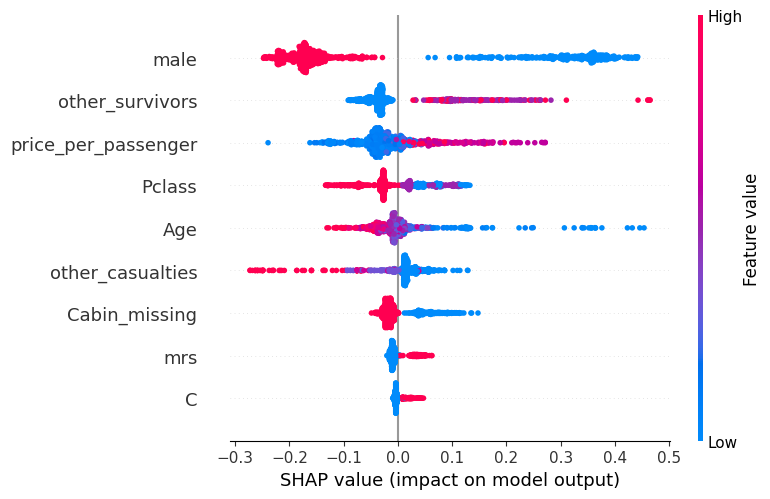

In [63]:
# Create a SHAP explainer for the Random Forest model
explainer = shap.TreeExplainer(rf_classifier)

# Generate SHAP values for the entire dataset
shap_values = explainer.shap_values(X_tr_val)

# Summary plot for feature importance using SHAP values
shap.summary_plot(shap_values[1], X_tr_val, feature_names=X_tr_val.columns, show=False)

# Display the plot
plt.show()

[12:47:30] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


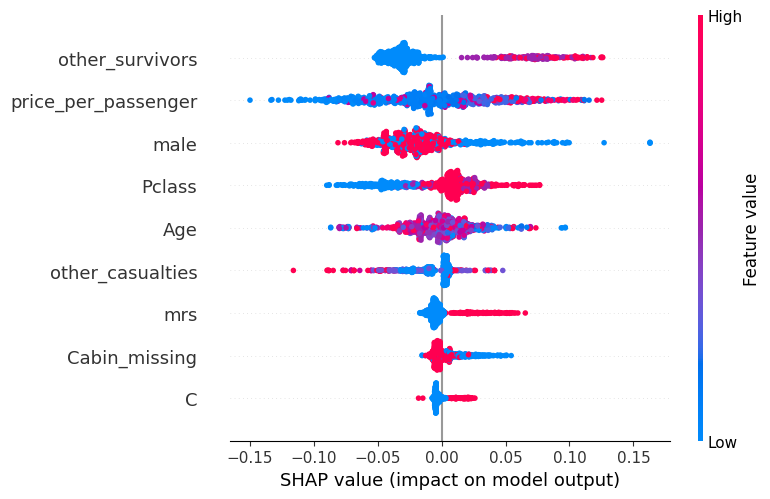

In [64]:
# For ensamble interpretation
# Extract individual model instances from the ensemble
rf_model = ensemble_classifier.named_estimators_['random_forest']
xgb_model = ensemble_classifier.named_estimators_['xgboost']
lgb_model = ensemble_classifier.named_estimators_['lightgbm']

# Create a SHAP explainer for each model
rf_explainer = shap.TreeExplainer(rf_model)
xgb_explainer = shap.Explainer(xgb_model)
lgb_explainer = shap.Explainer(lgb_model)

# Calculate SHAP values for the validation set
rf_shap_values = rf_explainer.shap_values(X_tr_val)
xgb_shap_values = xgb_explainer.shap_values(X_tr_val)
lgb_shap_values = lgb_explainer.shap_values(X_tr_val)

# Combine the SHAP values for each model using a weighted average
ensemble_shap_values = (rf_shap_values[0] + xgb_shap_values + lgb_shap_values[0]) / 3.0

# Plot summary plot for variable interpretation
shap.summary_plot(ensemble_shap_values, X_tr_val, feature_names=X_tr_val.columns)

# 10) Model tuning
Note: 
To improve performance hyper-parameter tuning can be explored.

In [65]:
# Predictions on Test set
# test_predictions = ensemble_classifier.predict(X_test)
test_predictions = ensemble_classifier.predict(X_test)
test_predictions

array([0., 0., 0., 1., 0., 0., 1., 0., 1., 1., 1., 0., 1., 1., 0., 0., 0.,
       0., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1.,
       1., 1., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       1., 1., 1., 0., 1., 1., 1., 1., 0., 1., 1., 0., 1., 1., 0., 1., 1.,
       0., 1., 1., 1., 1., 1., 1., 0., 1., 0., 0., 1., 1., 0., 1., 0., 1.,
       1., 0., 1., 1., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 0., 0., 0.,
       0., 1., 0., 1., 1., 1., 0., 0., 0., 0., 1., 1., 1., 1., 1., 0., 1.,
       1., 1., 1., 1., 1., 1., 0., 0., 1., 0., 1., 1., 1., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 1., 0., 0., 1., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 0., 1., 0.,
       0., 1., 0., 1., 0., 1., 0., 0., 0., 0., 1., 1., 1., 1., 1., 0., 0.,
       0., 0., 0., 0., 1.

In [66]:
# Convert predictions to a DataFrame with 'PassengerId' as the index
submission = pd.DataFrame(test_predictions, index=X_test.index, columns=['Survived']).reset_index(drop=False)
submission

,PassengerId,Survived
0,1126,0.0
1,1038,0.0
2,1281,0.0
3,1009,1.0
4,947,0.0
...,...,...
413,1302,1.0
414,1304,1.0
415,1305,0.0
416,1307,0.0


In [67]:
# Round the 'Survived' column to remove decimal spaces
submission['Survived'] = submission['Survived'].round().astype(int)
# Display the DataFrame
print(submission)

     PassengerId  Survived
0           1126         0
1           1038         0
2           1281         0
3           1009         1
4            947         0
..           ...       ...
413         1302         1
414         1304         1
415         1305         0
416         1307         0
417         1308         0

[418 rows x 2 columns]


In [68]:
# os.remove("/kaggle/working/submission.csv")

In [69]:
submission.to_csv('/kaggle/working/submission.csv', index=False)